In [18]:
import pandas as pd
import csv
import seaborn as sns
sns.set_theme(style="whitegrid")
from tabulate import tabulate
import missingno as msno
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.io as pio
import numpy as np

In [19]:
data = pd.read_csv('train.csv')
data

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.00
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.00
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.00
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.00
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,4,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,...,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904,2.44
21259,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
21260,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
21261,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84


In [20]:
elements = pd.read_csv('unique_m.csv')
elements

,H,He,Li,Be,B,C,N,O,F,Ne,...,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp,material
0,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,29.00,Ba0.2La1.8Cu1O4
1,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,26.00,Ba0.1La1.9Ag0.1Cu0.9O4
2,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,19.00,Ba0.1La1.9Cu1O4
3,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,22.00,Ba0.15La1.85Cu1O4
4,0.0,0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,23.00,Ba0.3La1.7Cu1O4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,2.44,Tm0.84Lu0.16Fe3Si5
21259,0.0,0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,0,...,0.0,0.0,1.0,0.0,0.0,0,0,0,122.10,Tl1Ba2Ca3Cu4O11
21260,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,1.98,Nb0.8Pd0.2
21261,0.0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,1.84,Nb0.69Pd0.31


#### Data info

In [21]:
data.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,...,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000
mean,4.115224,87.557631,72.988310,71.290627,58.539916,1.165608,1.063884,115.601251,33.225218,44.391893,...,3.153127,3.056536,3.055885,1.295682,1.052841,2.041010,1.483007,0.839342,0.673987,34.421219
std,1.439295,29.676497,33.490406,31.030272,36.651067,0.364930,0.401423,54.626887,26.967752,20.035430,...,1.191249,1.046257,1.174815,0.393155,0.380291,1.242345,0.978176,0.484676,0.455580,34.254362
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.458076,52.143839,58.041225,35.248990,0.966676,0.775363,78.512902,16.824174,32.890369,...,2.116732,2.279705,2.091251,1.060857,0.775678,1.000000,0.921454,0.451754,0.306892,5.365000
50%,4.000000,84.922750,60.696571,66.361592,39.918385,1.199541,1.146783,122.906070,26.636008,45.123500,...,2.618182,2.615321,2.434057,1.368922,1.166532,2.000000,1.063077,0.800000,0.500000,20.000000
75%,5.000000,100.404410,86.103540,78.116681,73.113234,1.444537,1.359418,154.119320,38.356908,59.322812,...,4.026201,3.727919,3.914868,1.589027,1.330801,3.000000,1.918400,1.200000,1.020436,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


In [7]:
headers = ["Column Name", "Data Type", "Non-Null Count"]
data_1 = [[col, data[col].dtype, data[col].count()] for col in data.columns]
table = tabulate(data_1, headers=headers, tablefmt="pretty")
print(table)

+---------------------------------+-----------+----------------+
|           Column Name           | Data Type | Non-Null Count |
+---------------------------------+-----------+----------------+
|       number_of_elements        |   int64   |     21263      |
|        mean_atomic_mass         |  float64  |     21263      |
|      wtd_mean_atomic_mass       |  float64  |     21263      |
|        gmean_atomic_mass        |  float64  |     21263      |
|      wtd_gmean_atomic_mass      |  float64  |     21263      |
|       entropy_atomic_mass       |  float64  |     21263      |
|     wtd_entropy_atomic_mass     |  float64  |     21263      |
|        range_atomic_mass        |  float64  |     21263      |
|      wtd_range_atomic_mass      |  float64  |     21263      |
|         std_atomic_mass         |  float64  |     21263      |
|       wtd_std_atomic_mass       |  float64  |     21263      |
|            mean_fie             |  float64  |     21263      |
|          wtd_mean_fie  

#### duplicates check

In [17]:
duplicateRows = data[data.duplicated()]
duplicateRows

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
8503,4,76.444563,51.381751,59.356672,35.040763,1.199541,1.291294,121.327600,14.343486,43.823354,...,2.077220,2.213364,2.063611,1.368922,1.203843,1,0.841699,0.433013,0.266940,93.00
12598,2,39.513500,45.227500,37.824826,43.895938,0.650720,0.431701,22.856000,31.184750,11.428000,...,4.750000,4.472136,4.728708,0.686962,0.514653,1,2.750000,0.500000,0.433013,17.00
12736,2,105.962750,121.538200,71.855677,86.707541,0.391159,0.308132,155.754500,99.069800,77.877250,...,5.200000,4.898979,5.101698,0.673012,0.617242,2,2.000000,1.000000,0.979796,2.84
12798,2,141.926690,149.730928,136.457070,144.380165,0.654860,0.588079,78.042380,67.406528,39.021190,...,5.400000,5.477226,5.378269,0.689009,0.686962,1,0.600000,0.500000,0.489898,2.35
12829,2,141.568190,141.568190,132.942020,132.942020,0.632849,0.632849,97.323620,48.661810,48.661810,...,5.500000,5.477226,5.477226,0.689009,0.689009,1,0.500000,0.500000,0.500000,2.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16734,2,141.568190,131.835828,132.942020,123.748210,0.632849,0.681188,97.323620,20.348172,48.661810,...,5.400000,5.477226,5.378269,0.689009,0.686962,1,0.600000,0.500000,0.489898,1.78
20068,2,114.090000,119.228900,113.831890,119.084493,0.690886,0.417951,15.340000,84.110300,7.670000,...,4.835000,4.472136,4.819254,0.686962,0.398567,1,3.515000,0.500000,0.371181,4.90
20069,2,118.289000,120.024500,118.238064,119.986110,0.692717,0.550104,6.942000,62.615500,3.471000,...,4.500000,3.872983,4.400559,0.661563,0.450561,2,3.000000,1.000000,0.866025,4.10
20071,3,143.662190,147.731162,138.810446,144.499365,1.063590,0.773268,90.546569,81.551291,38.670969,...,5.633634,4.932424,5.604750,1.085189,0.683593,2,3.867868,0.816497,0.546084,2.60


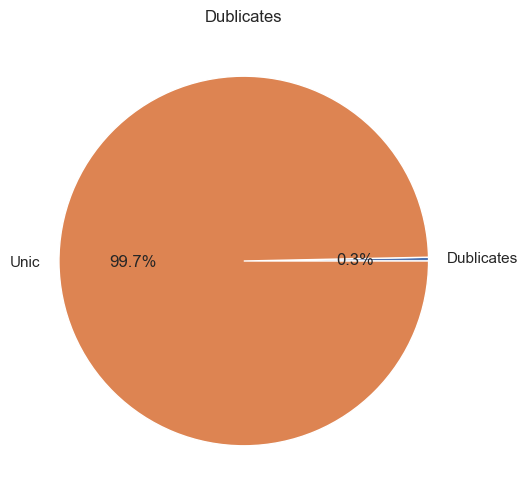

In [18]:
total_duplicates = len(duplicateRows)


total_unique = len(data) - total_duplicates


plt.figure(figsize=(6, 6))
plt.pie([total_duplicates, total_unique], labels=['Dublicates', 'Unic'], autopct='%1.1f%%')
plt.title('Dublicates')
plt.show()

In [20]:
duplicate_rows = data[data.duplicated(keep=False)]
duplicate_rows

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
360,4,76.444563,51.381751,59.356672,35.040763,1.199541,1.291294,121.327600,14.343486,43.823354,...,2.077220,2.213364,2.063611,1.368922,1.203843,1,0.841699,0.433013,0.266940,93.00
8503,4,76.444563,51.381751,59.356672,35.040763,1.199541,1.291294,121.327600,14.343486,43.823354,...,2.077220,2.213364,2.063611,1.368922,1.203843,1,0.841699,0.433013,0.266940,93.00
10567,2,60.332250,54.791708,59.596931,54.326799,0.680984,0.573959,18.781500,26.205278,9.390750,...,4.590000,3.872983,4.502887,0.661563,0.393896,2,3.360000,1.000000,0.807403,9.70
10568,2,60.332250,55.110993,59.596931,54.617434,0.680984,0.593764,18.781500,24.153981,9.390750,...,4.556000,3.872983,4.463953,0.661563,0.416027,2,3.224000,1.000000,0.831182,12.30
10569,2,60.332250,55.373934,59.596931,54.857947,0.680984,0.608434,18.781500,22.464678,9.390750,...,4.528000,3.872983,4.432142,0.661563,0.433585,2,3.112000,1.000000,0.849244,14.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16734,2,141.568190,131.835828,132.942020,123.748210,0.632849,0.681188,97.323620,20.348172,48.661810,...,5.400000,5.477226,5.378269,0.689009,0.686962,1,0.600000,0.500000,0.489898,1.78
20068,2,114.090000,119.228900,113.831890,119.084493,0.690886,0.417951,15.340000,84.110300,7.670000,...,4.835000,4.472136,4.819254,0.686962,0.398567,1,3.515000,0.500000,0.371181,4.90
20069,2,118.289000,120.024500,118.238064,119.986110,0.692717,0.550104,6.942000,62.615500,3.471000,...,4.500000,3.872983,4.400559,0.661563,0.450561,2,3.000000,1.000000,0.866025,4.10
20071,3,143.662190,147.731162,138.810446,144.499365,1.063590,0.773268,90.546569,81.551291,38.670969,...,5.633634,4.932424,5.604750,1.085189,0.683593,2,3.867868,0.816497,0.546084,2.60


In [49]:
duplicateRows = elements[elements.duplicated()]
duplicateRows

,H,He,Li,Be,B,C,N,O,F,Ne,...,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp,material


In [50]:
el_360 = elements.iloc[[360]]
el_360

,H,He,Li,Be,B,C,N,O,F,Ne,...,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp,material
360,0.0,0,0.0,0.0,0.0,0.0,0.0,13.9,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,93.0,Y2Ba4Cu6O13.9


In [51]:
el_8503 = elements.iloc[[8503]]
el_8503

,H,He,Li,Be,B,C,N,O,F,Ne,...,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp,material
8503,0.0,0,0.0,0.0,0.0,0.0,0.0,6.95,0.0,0,...,0.0,0.0,0.0,0.0,0.0,0,0,0,93.0,Y1Ba2Cu3O6.95


<Axes: >

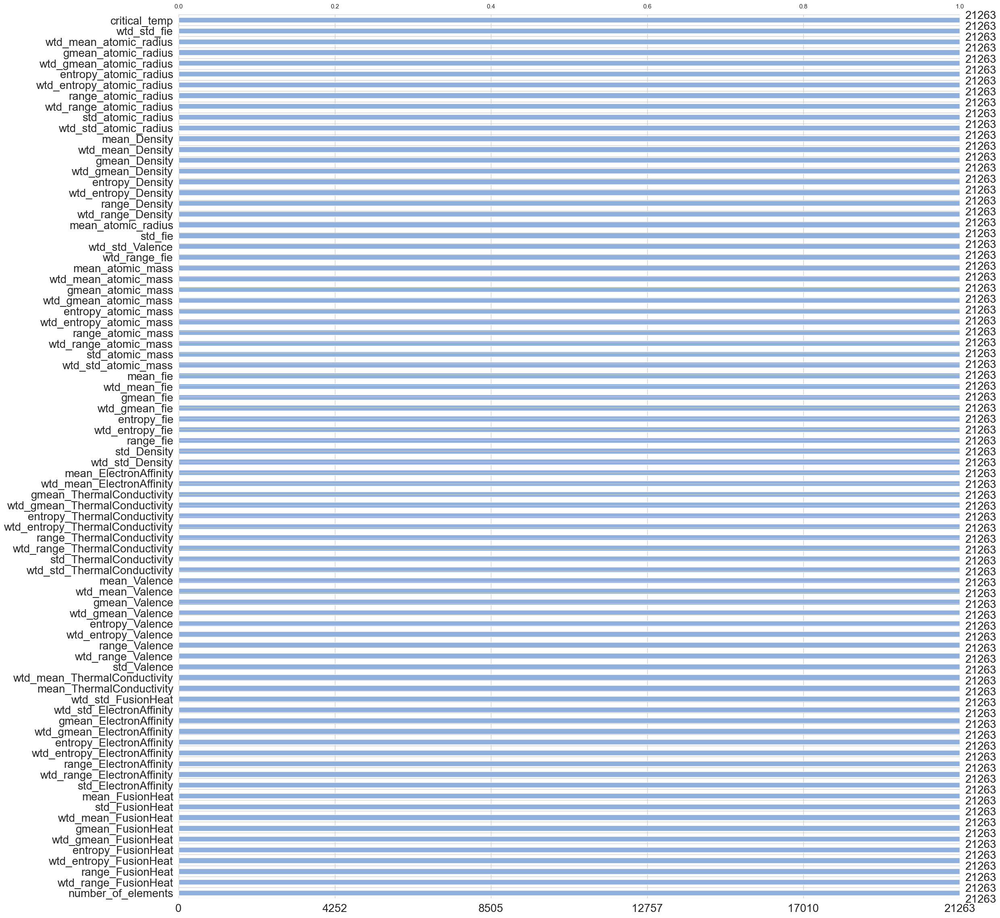

In [52]:
msno.bar(data, color="#8FB0DD", sort="ascending",  fontsize=20)

In [53]:
data.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,...,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000
mean,4.115224,87.557631,72.988310,71.290627,58.539916,1.165608,1.063884,115.601251,33.225218,44.391893,...,3.153127,3.056536,3.055885,1.295682,1.052841,2.041010,1.483007,0.839342,0.673987,34.421219
std,1.439295,29.676497,33.490406,31.030272,36.651067,0.364930,0.401423,54.626887,26.967752,20.035430,...,1.191249,1.046257,1.174815,0.393155,0.380291,1.242345,0.978176,0.484676,0.455580,34.254362
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.458076,52.143839,58.041225,35.248990,0.966676,0.775363,78.512902,16.824174,32.890369,...,2.116732,2.279705,2.091251,1.060857,0.775678,1.000000,0.921454,0.451754,0.306892,5.365000
50%,4.000000,84.922750,60.696571,66.361592,39.918385,1.199541,1.146783,122.906070,26.636008,45.123500,...,2.618182,2.615321,2.434057,1.368922,1.166532,2.000000,1.063077,0.800000,0.500000,20.000000
75%,5.000000,100.404410,86.103540,78.116681,73.113234,1.444537,1.359418,154.119320,38.356908,59.322812,...,4.026201,3.727919,3.914868,1.589027,1.330801,3.000000,1.918400,1.200000,1.020436,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


In [21]:
data = data.drop(columns=['number_of_elements'])
data

,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,53.622535,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.00
1,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,53.979870,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.00
2,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,53.656268,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.00
3,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,53.639405,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.00
4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,53.588771,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,43.202659,...,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904,2.44
21259,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,50.148287,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
21260,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,5.405448,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
21261,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,6.249958,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84


In [22]:
data = data.drop_duplicates()

# Print the updated dataset
data

,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,53.622535,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.00
1,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,53.979870,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.00
2,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,53.656268,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.00
3,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,53.639405,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.00
4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,53.588771,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,43.202659,...,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904,2.44
21259,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,50.148287,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
21260,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,5.405448,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
21261,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,6.249958,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84


In [23]:
data.to_csv('train_1.csv', index=False)

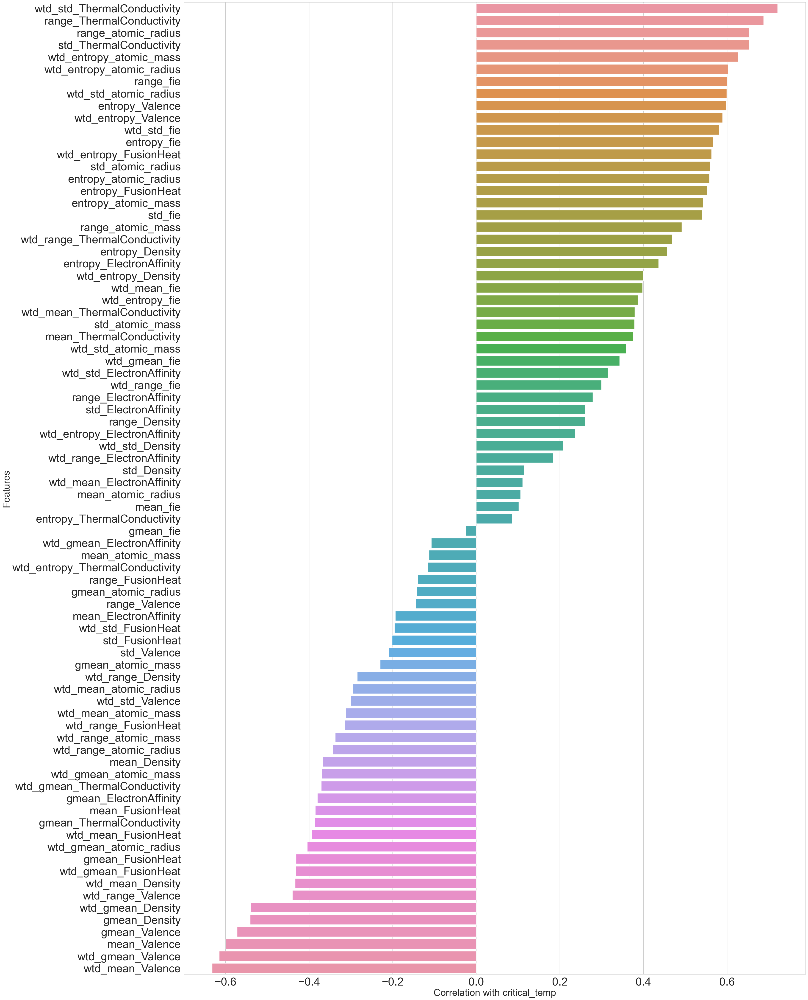

In [12]:
fig, ax = plt.subplots(figsize=(35, 55))
corr = data.corr()["critical_temp"].sort_values(ascending=False) 
# Remove the correlation value for the target variable itself, as it is always 1.0
corr.drop("critical_temp", inplace=True) 

sns.barplot(x=corr, y=corr.index) # Create a bar plot to visualize the correlations
plt.xlabel('Correlation with critical_temp', fontsize=30) # Add a label to the x-axis of the plot
plt.ylabel('Features', fontsize=30)
ax.tick_params(axis='y', labelsize=35)
ax.tick_params(axis='x', labelsize=35)
plt.show()


In [9]:
corr = data.corr()["critical_temp"].sort_values(ascending=False)

# Remove the correlation value for the target variable itself
corr.drop("critical_temp", inplace=True)

# Create a DataFrame to hold the correlations
corr_df = pd.DataFrame({'Feature Name': corr.index, 'Correlation Score': corr.values})

# Display the DataFrame
corr_df

,Feature Name,Correlation Score
0,wtd_std_ThermalConductivity,0.721271
1,range_ThermalConductivity,0.687654
2,range_atomic_radius,0.653759
3,std_ThermalConductivity,0.653632
4,wtd_entropy_atomic_mass,0.626930
...,...,...
76,gmean_Density,-0.541684
77,gmean_Valence,-0.573068
78,mean_Valence,-0.600085
79,wtd_gmean_Valence,-0.615653


In [10]:
corr_df.describe()

,Correlation Score
count,81.000000
mean,0.080769
std,0.417510
min,-0.632401
25%,-0.314178
50%,0.111516
75%,0.469572
max,0.721271


In [13]:
data_1_corr = data.drop(columns=['critical_temp', 'number_of_elements'])
data_1_corr

,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
0,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,53.622535,...,2.25,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059
1,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,53.979870,...,2.00,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606
2,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,53.656268,...,2.25,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697
3,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,53.639405,...,2.25,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952
4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,53.588771,...,2.25,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21258,106.957877,53.095769,82.515384,43.135565,1.177145,1.254119,146.88130,15.504479,65.764081,43.202659,...,3.25,3.555556,3.223710,3.519911,1.377820,0.913658,1,2.168889,0.433013,0.496904
21259,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,50.148287,...,2.20,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959
21260,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,5.405448,...,4.50,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000
21261,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,6.249958,...,4.50,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493


In [14]:
close_corr =data_1_corr.corr(method = 'pearson')
close_corr

,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
mean_atomic_mass,1.000000,0.815977,0.940298,0.745841,-0.104000,-0.097609,0.125659,0.446225,0.196460,0.130675,...,0.374099,0.304683,0.392153,0.321399,-0.156786,-0.145610,-0.107450,0.168633,-0.080279,-0.081253
wtd_mean_atomic_mass,0.815977,1.000000,0.848242,0.964085,-0.308046,-0.412666,-0.144029,0.716623,-0.060739,-0.089471,...,0.534450,0.545587,0.539780,0.548981,-0.375718,-0.331025,-0.039155,0.330904,-0.003681,0.077323
gmean_atomic_mass,0.940298,0.848242,1.000000,0.856975,-0.190214,-0.232183,-0.175861,0.458473,-0.121708,-0.166042,...,0.487021,0.427961,0.511508,0.450357,-0.306246,-0.307662,-0.165010,0.272303,-0.124627,-0.117336
wtd_gmean_atomic_mass,0.745841,0.964085,0.856975,1.000000,-0.370561,-0.484664,-0.352093,0.673326,-0.274487,-0.331657,...,0.599413,0.614100,0.608417,0.623261,-0.477785,-0.448072,-0.078641,0.409674,-0.033313,0.030361
entropy_atomic_mass,-0.104000,-0.308046,-0.190214,-0.370561,1.000000,0.889709,0.538774,-0.284941,0.357951,0.413647,...,-0.551641,-0.586855,-0.554477,-0.592817,0.963621,0.861479,0.203207,-0.350047,0.087838,0.018758
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wtd_entropy_Valence,-0.145610,-0.331025,-0.307662,-0.448072,0.861479,0.918284,0.683238,-0.409599,0.540601,0.606574,...,-0.558969,-0.636286,-0.563527,-0.648708,0.910822,1.000000,0.204411,-0.639818,0.089774,0.081284
range_Valence,-0.107450,-0.039155,-0.165010,-0.078641,0.203207,0.161350,0.208861,0.023251,0.192347,0.177675,...,0.085892,0.111249,-0.041651,0.033007,0.155410,0.204411,1.000000,0.114000,0.973788,0.867393
wtd_range_Valence,0.168633,0.330904,0.272303,0.409674,-0.350047,-0.546910,-0.365395,0.594214,-0.273598,-0.391024,...,0.554338,0.683700,0.532805,0.681415,-0.417283,-0.639818,0.114000,1.000000,0.184380,0.132162
std_Valence,-0.080279,-0.003681,-0.124627,-0.033313,0.087838,0.056309,0.134676,0.066739,0.144106,0.123636,...,0.164058,0.186270,0.034589,0.108469,0.034580,0.089774,0.973788,0.184380,1.000000,0.885856


In [15]:
close_corr.describe()

,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,wtd_std_atomic_mass,...,mean_Valence,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence
count,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,...,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000
mean,0.060144,0.023207,0.008866,-0.016119,0.165680,0.154997,0.184060,0.025262,0.174145,0.168418,...,-0.014621,-0.020495,-0.023337,-0.025667,0.177490,0.172483,0.105228,-0.008922,0.088446,0.072653
std,0.315014,0.418310,0.382661,0.468967,0.503507,0.534713,0.424632,0.358222,0.347748,0.393883,...,0.511376,0.526726,0.512261,0.530623,0.537136,0.532064,0.230815,0.405178,0.214333,0.230721
min,-0.347582,-0.554820,-0.512841,-0.681130,-0.592817,-0.655734,-0.506071,-0.543305,-0.384091,-0.473078,...,-0.759162,-0.756621,-0.761860,-0.761772,-0.657725,-0.648708,-0.238393,-0.639818,-0.232050,-0.323640
25%,-0.149899,-0.285120,-0.257957,-0.356710,-0.318007,-0.423042,-0.204948,-0.270156,-0.132917,-0.187184,...,-0.466530,-0.490842,-0.471899,-0.494837,-0.348620,-0.395579,-0.047367,-0.378949,-0.021201,-0.026916
50%,-0.054702,-0.083204,-0.119522,-0.161273,0.200574,0.193344,0.209292,-0.057681,0.194255,0.155423,...,-0.073444,-0.047599,-0.091873,-0.058948,0.206955,0.200027,0.083540,-0.001209,0.055884,0.072716
75%,0.196862,0.276308,0.224812,0.306714,0.605024,0.660795,0.590366,0.249165,0.456239,0.489585,...,0.420034,0.441362,0.426636,0.451688,0.681249,0.668723,0.203508,0.331646,0.161789,0.157421
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


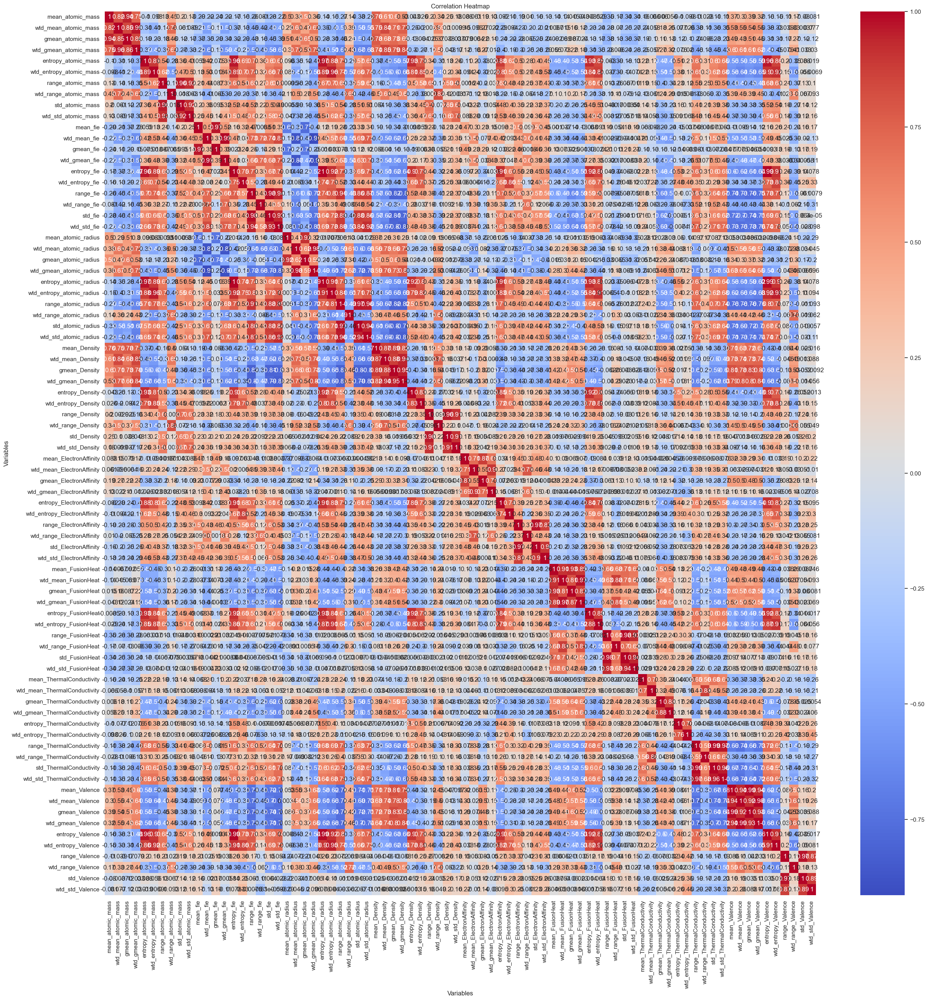

In [16]:
plt.figure(figsize=(30, 30))  # Set the size of the heatmap figure
sns.heatmap(close_corr, annot=True, cmap='coolwarm')


plt.title('Correlation Heatmap')
plt.xlabel('Variables')
plt.ylabel('Variables')


plt.show()

In [17]:
import plotly.graph_objects as go
import plotly.offline as pyo


fig = go.Figure(data=go.Heatmap(z=close_corr.values, x=close_corr.columns, y=close_corr.index, colorscale='Viridis'))


fig.update_layout(title='Correlation Heatmap')


fig.update_layout(height=1300, width=1550)


pyo.plot(fig, filename='heatmap.html', auto_open=True)

'heatmap.html'

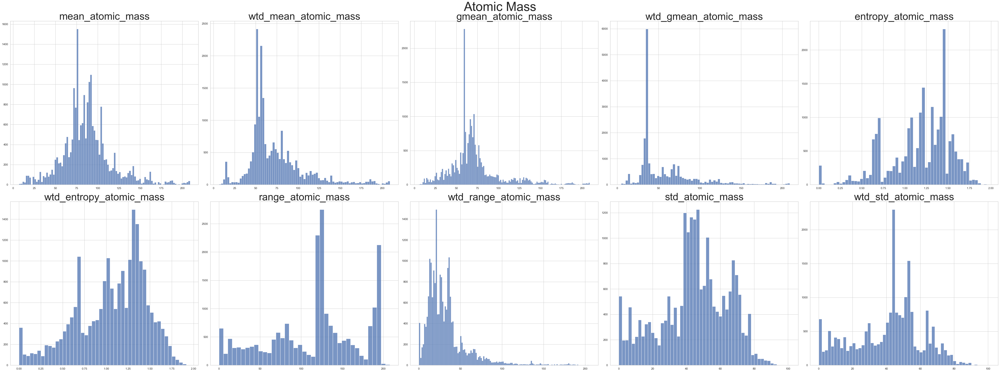

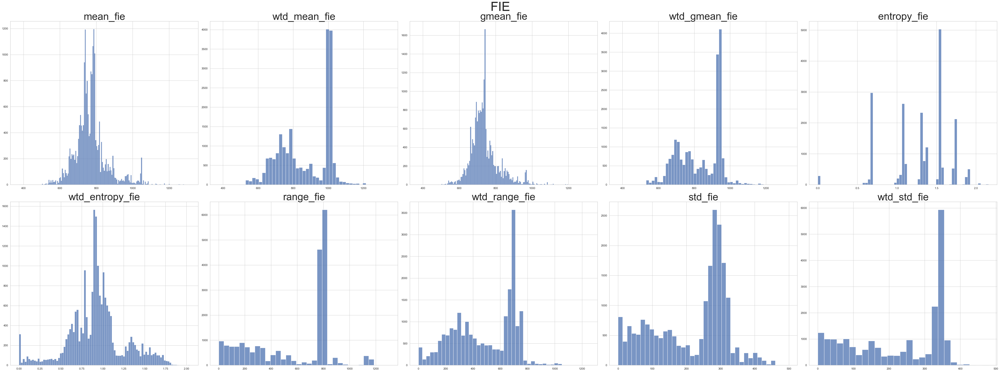

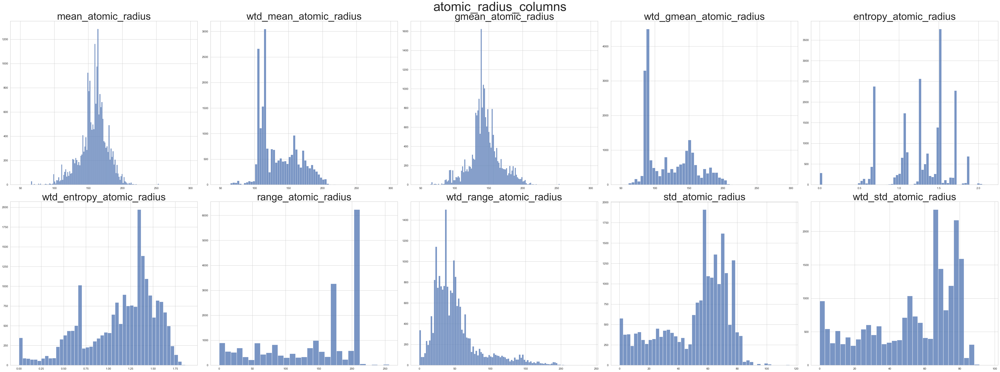

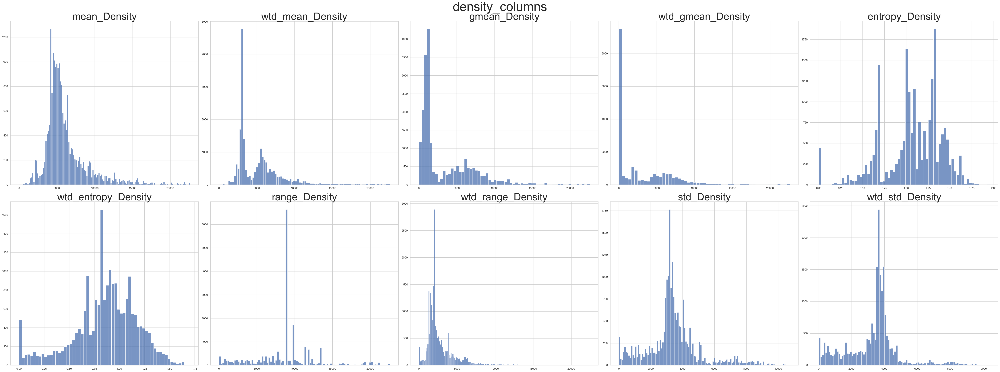

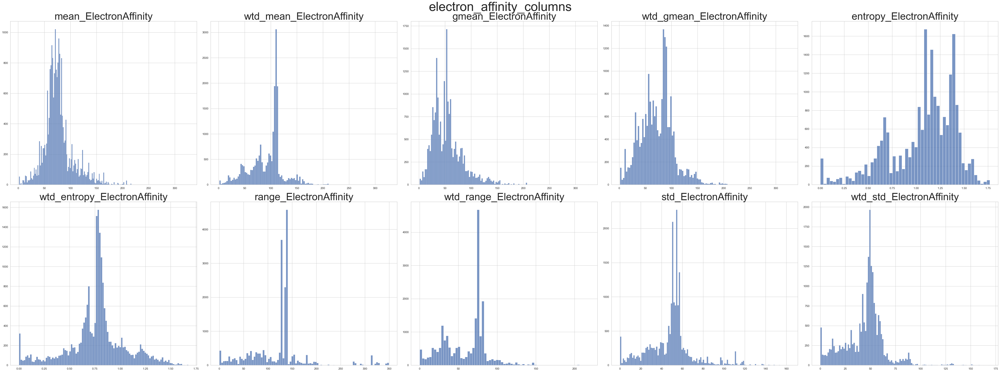

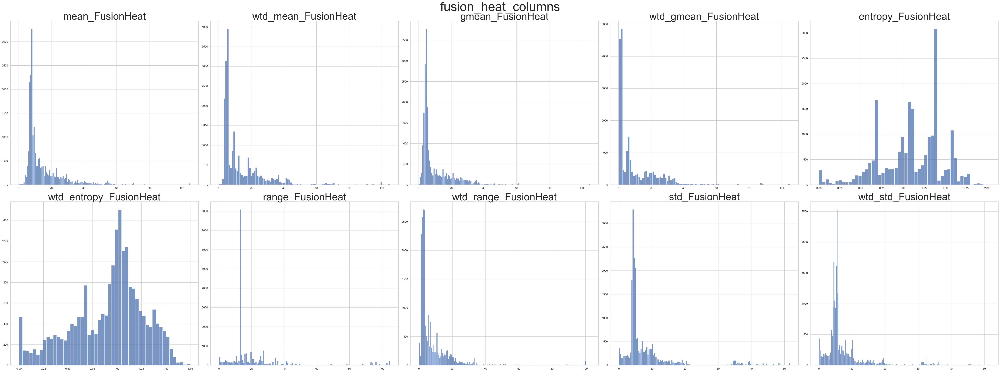

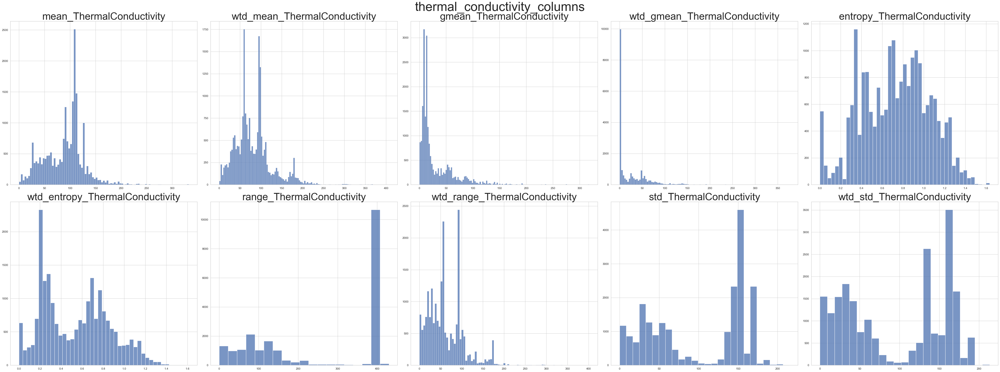

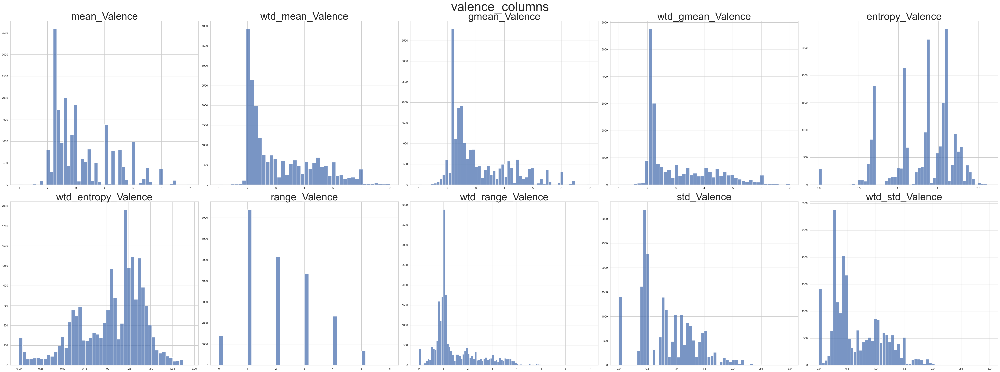

In [60]:
atomic_mass_columns = ['mean_atomic_mass', 'wtd_mean_atomic_mass', 'gmean_atomic_mass', 'wtd_gmean_atomic_mass',
                       'entropy_atomic_mass', 'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
                       'std_atomic_mass', 'wtd_std_atomic_mass']

fie_columns = ['mean_fie', 'wtd_mean_fie', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
               'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie']

atomic_radius_columns = ['mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'wtd_gmean_atomic_radius',
                         'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'range_atomic_radius', 'wtd_range_atomic_radius',
                         'std_atomic_radius', 'wtd_std_atomic_radius']

density_columns = ['mean_Density', 'wtd_mean_Density', 'gmean_Density', 'wtd_gmean_Density',
                   'entropy_Density', 'wtd_entropy_Density', 'range_Density', 'wtd_range_Density',
                   'std_Density', 'wtd_std_Density']

electron_affinity_columns = ['mean_ElectronAffinity', 'wtd_mean_ElectronAffinity', 'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
                             'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity', 'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
                             'std_ElectronAffinity', 'wtd_std_ElectronAffinity']

fusion_heat_columns = ['mean_FusionHeat', 'wtd_mean_FusionHeat', 'gmean_FusionHeat', 'wtd_gmean_FusionHeat',
                       'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'range_FusionHeat', 'wtd_range_FusionHeat',
                       'std_FusionHeat', 'wtd_std_FusionHeat']

thermal_conductivity_columns = ['mean_ThermalConductivity', 'wtd_mean_ThermalConductivity', 'gmean_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
                                'entropy_ThermalConductivity', 'wtd_entropy_ThermalConductivity', 'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
                                'std_ThermalConductivity', 'wtd_std_ThermalConductivity']

valence_columns = ['mean_Valence', 'wtd_mean_Valence', 'gmean_Valence', 'wtd_gmean_Valence',
                   'entropy_Valence', 'wtd_entropy_Valence', 'range_Valence', 'wtd_range_Valence',
                   'std_Valence', 'wtd_std_Valence']

# Создайте сабплоты для колонок atomic_mass
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(atomic_mass_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Atomic Mass', fontsize=50, y=1.02)
plt.show()

# Создайте сабплоты для колонок fie
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(fie_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('FIE', fontsize=50, y=1.02)
plt.show()

# atomic_radius_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(atomic_radius_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('atomic_radius_columns', fontsize=50, y=1.02)
plt.show()


# density_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(density_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('density_columns', fontsize=50, y=1.02)
plt.show()



# electron_affinity_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(electron_affinity_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('electron_affinity_columns', fontsize=50, y=1.02)
plt.show()



# fusion_heat_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(fusion_heat_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('fusion_heat_columns', fontsize=50, y=1.02)
plt.show()






# thermal_conductivity_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(thermal_conductivity_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('thermal_conductivity_columns', fontsize=50, y=1.02)
plt.show()





# valence_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(valence_columns):
    sns.histplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('valence_columns', fontsize=50, y=1.02)
plt.show()

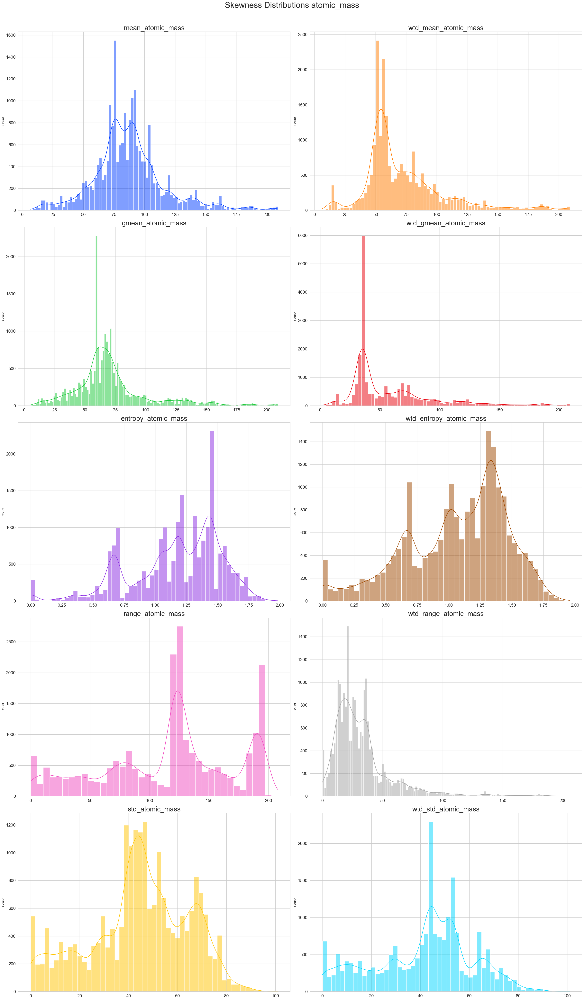

In [33]:
columns = ['mean_atomic_mass', 'wtd_mean_atomic_mass', 'gmean_atomic_mass', 'wtd_gmean_atomic_mass',
           'entropy_atomic_mass', 'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
           'std_atomic_mass', 'wtd_std_atomic_mass']


fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16) 
plt.tight_layout()
plt.suptitle('Skewness Distributions atomic_mass', fontsize=30, y=1.02)
plt.show()



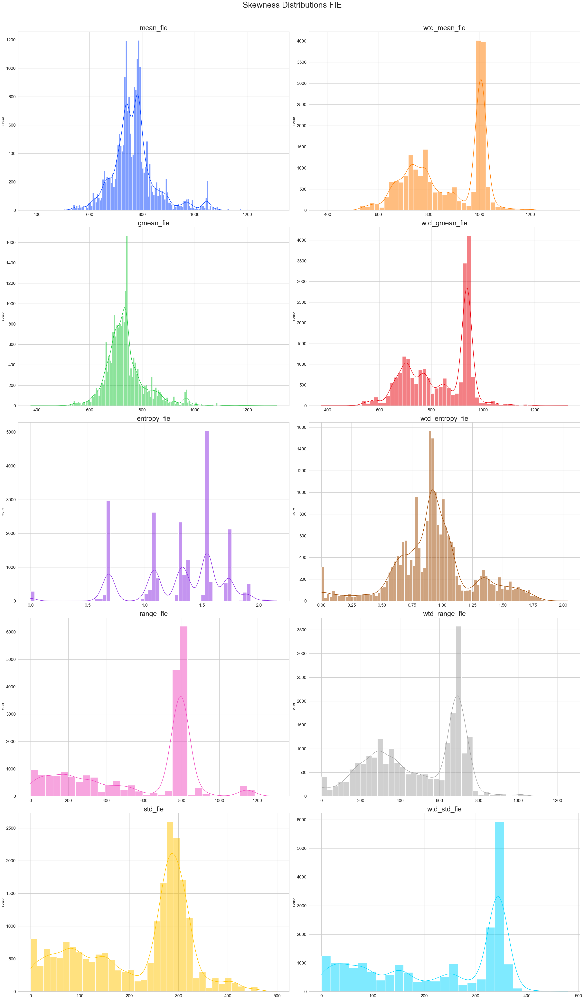

In [36]:
fie_columns = ['mean_fie', 'wtd_mean_fie', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
               'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie']

fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(fie_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions FIE', fontsize=30, y=1.02)
plt.show()

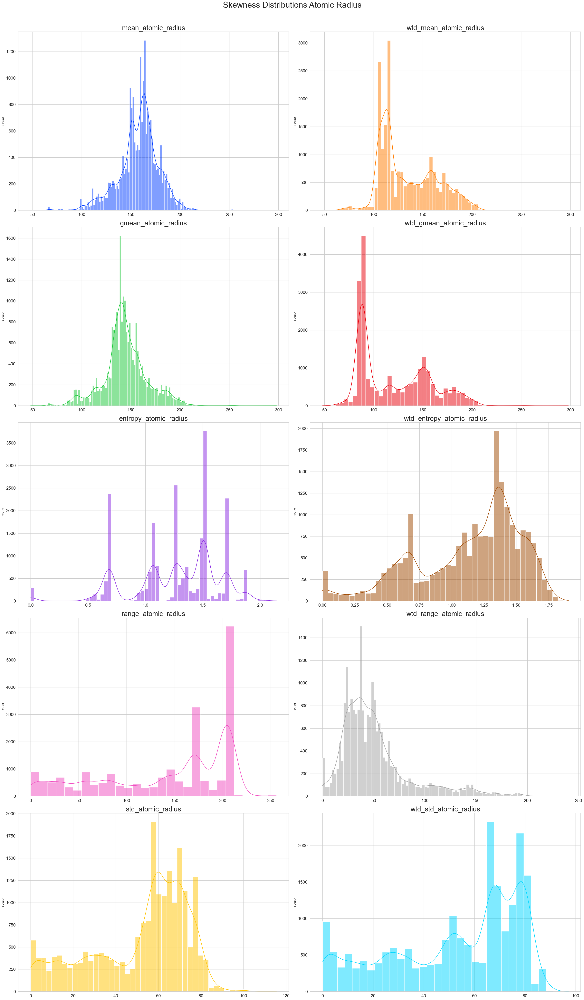

In [37]:
atomic_radius_columns = ['mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'wtd_gmean_atomic_radius',
                         'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'range_atomic_radius', 'wtd_range_atomic_radius',
                         'std_atomic_radius', 'wtd_std_atomic_radius']

fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(atomic_radius_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions Atomic Radius', fontsize=30, y=1.02)
plt.show()

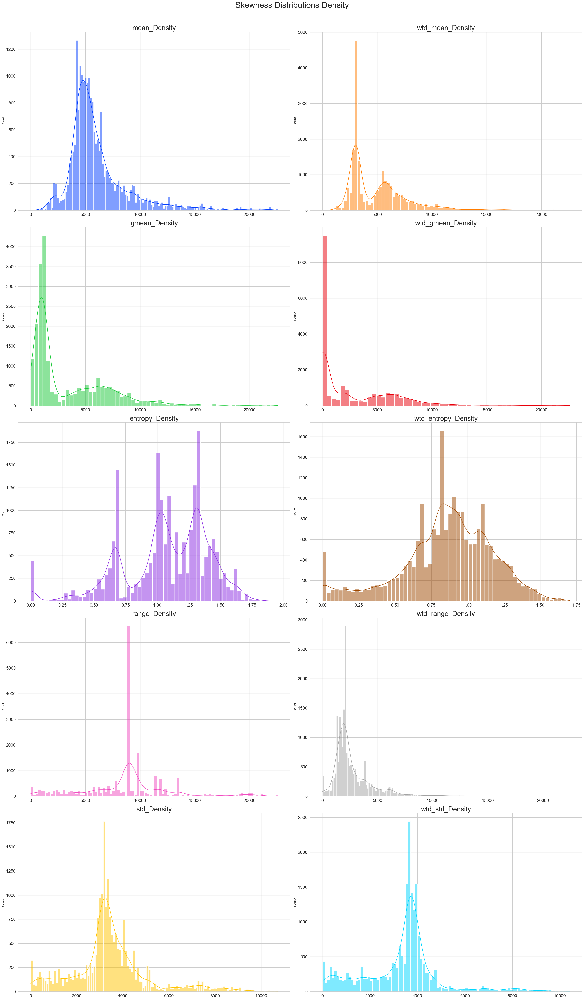

In [40]:
density_columns = ['mean_Density', 'wtd_mean_Density', 'gmean_Density', 'wtd_gmean_Density',
                   'entropy_Density', 'wtd_entropy_Density', 'range_Density', 'wtd_range_Density',
                   'std_Density', 'wtd_std_Density']


fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(density_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions Density', fontsize=30, y=1.02)
plt.show()

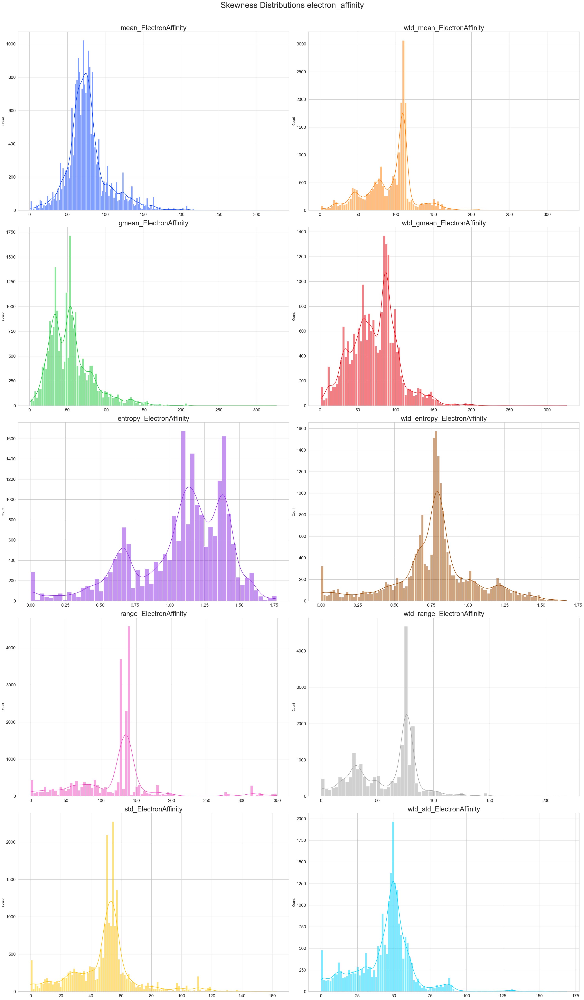

In [39]:
electron_affinity_columns = ['mean_ElectronAffinity', 'wtd_mean_ElectronAffinity', 'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
                             'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity', 'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
                             'std_ElectronAffinity', 'wtd_std_ElectronAffinity']


fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(electron_affinity_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions electron_affinity', fontsize=30, y=1.02)
plt.show()

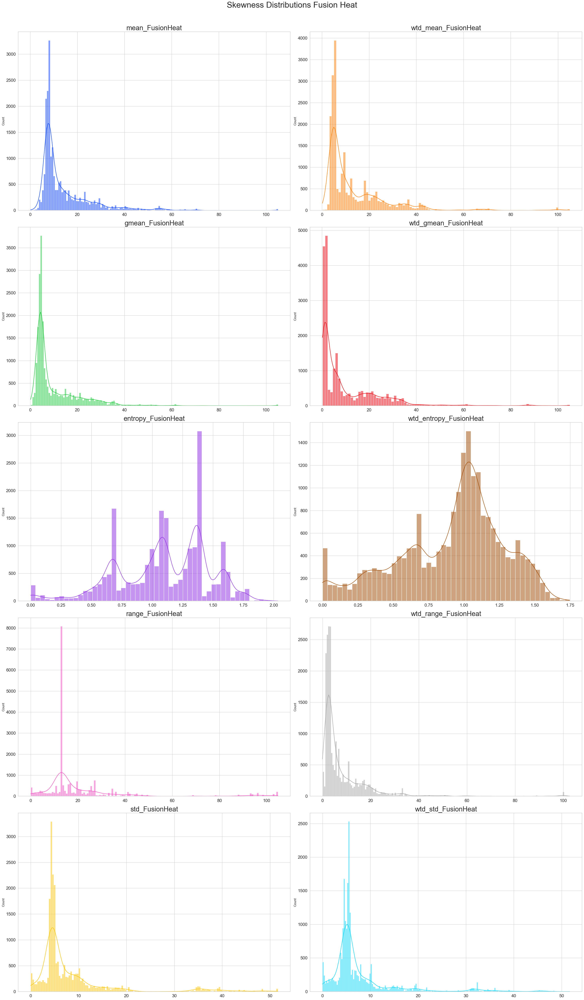

In [41]:
fusion_heat_columns = ['mean_FusionHeat', 'wtd_mean_FusionHeat', 'gmean_FusionHeat', 'wtd_gmean_FusionHeat',
                       'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'range_FusionHeat', 'wtd_range_FusionHeat',
                       'std_FusionHeat', 'wtd_std_FusionHeat']


fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(fusion_heat_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions Fusion Heat', fontsize=30, y=1.02)
plt.show()

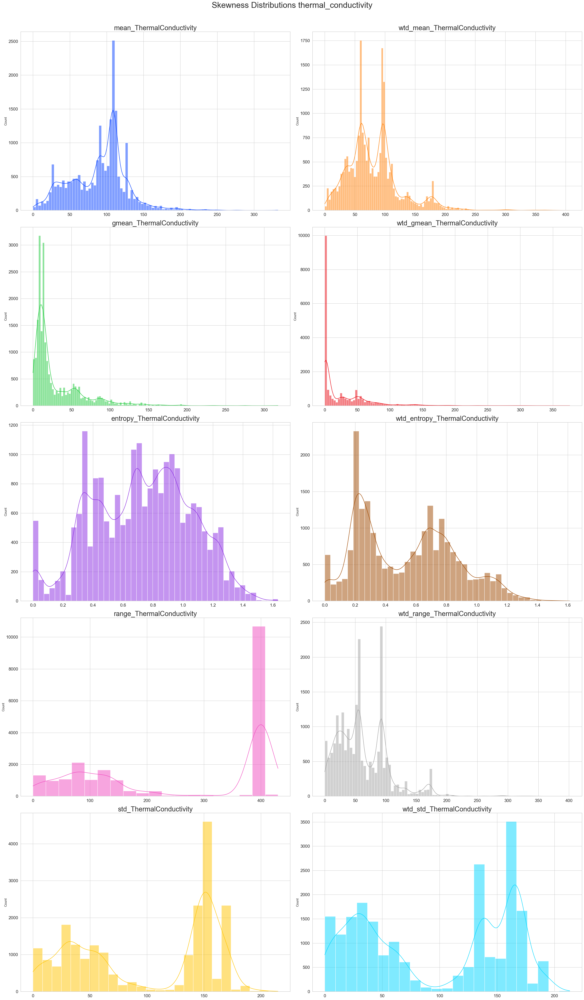

In [42]:
thermal_conductivity_columns = ['mean_ThermalConductivity', 'wtd_mean_ThermalConductivity', 'gmean_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
                                'entropy_ThermalConductivity', 'wtd_entropy_ThermalConductivity', 'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
                                'std_ThermalConductivity', 'wtd_std_ThermalConductivity']


fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(thermal_conductivity_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions thermal_conductivity', fontsize=30, y=1.02)
plt.show()

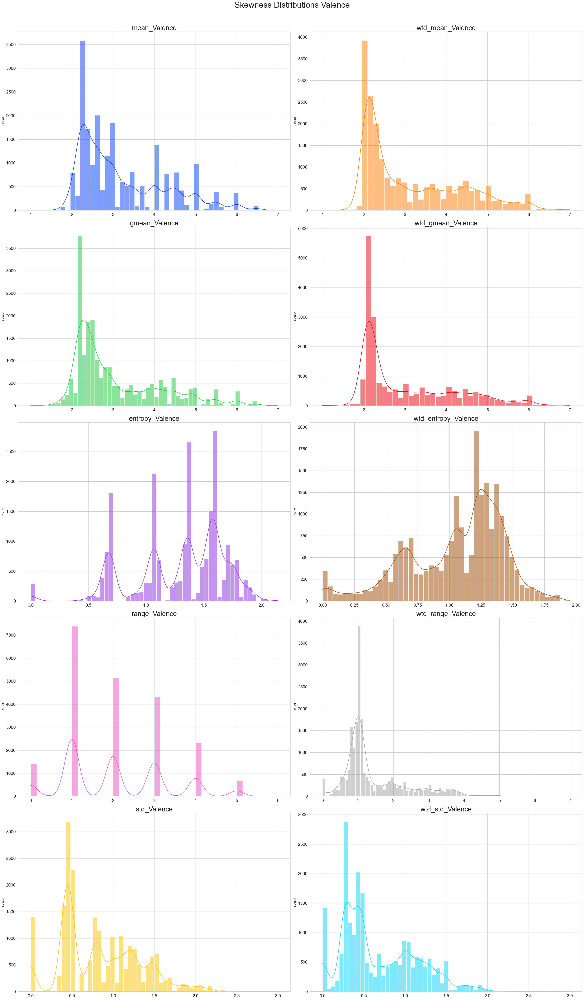

In [43]:
valence_columns = ['mean_Valence', 'wtd_mean_Valence', 'gmean_Valence', 'wtd_gmean_Valence',
                   'entropy_Valence', 'wtd_entropy_Valence', 'range_Valence', 'wtd_range_Valence',
                   'std_Valence', 'wtd_std_Valence']



fig, axes = plt.subplots(5, 2, figsize=(30, 50))
axes = axes.flatten()

colors = sns.color_palette('bright')

for i, column in enumerate(valence_columns):
    sns.histplot(data[column], kde=True, color=colors[i], ax=axes[i])
    axes[i].set_title(column, fontsize=25)
    axes[i].set_xlabel('')
    axes[i].tick_params(axis='both', labelsize=16)  

plt.tight_layout()
plt.suptitle('Skewness Distributions Valence', fontsize=30, y=1.02)
plt.show()

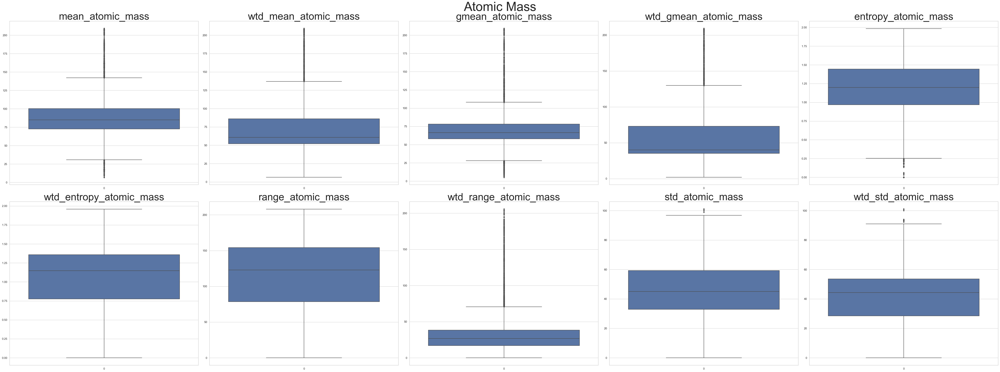

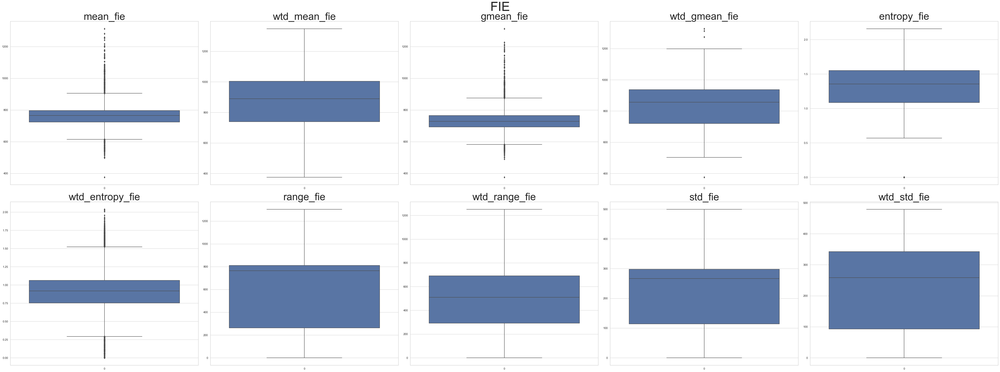

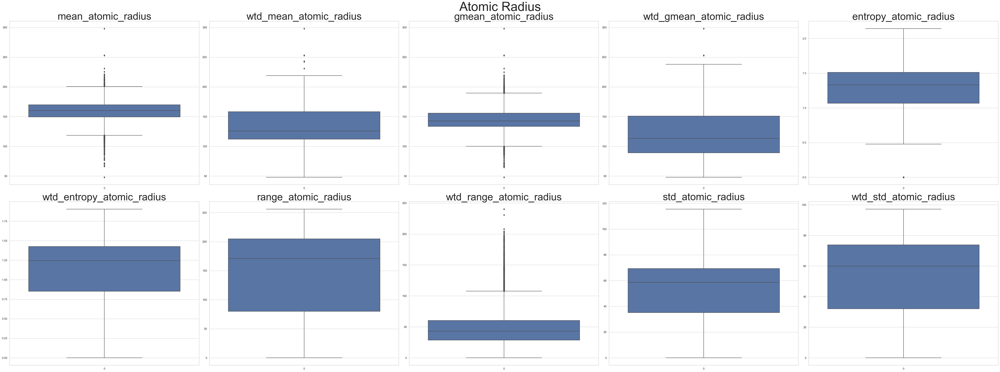

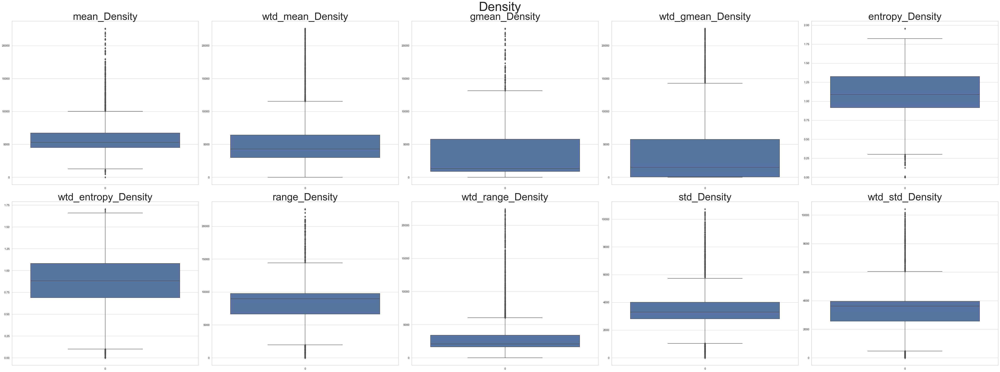

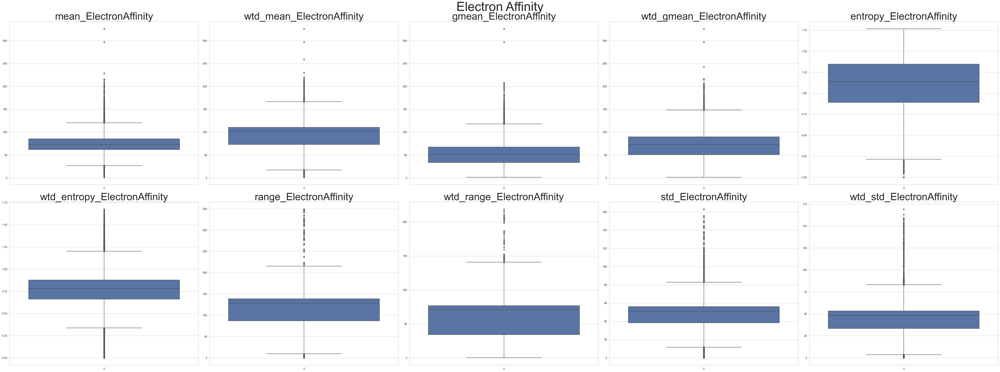

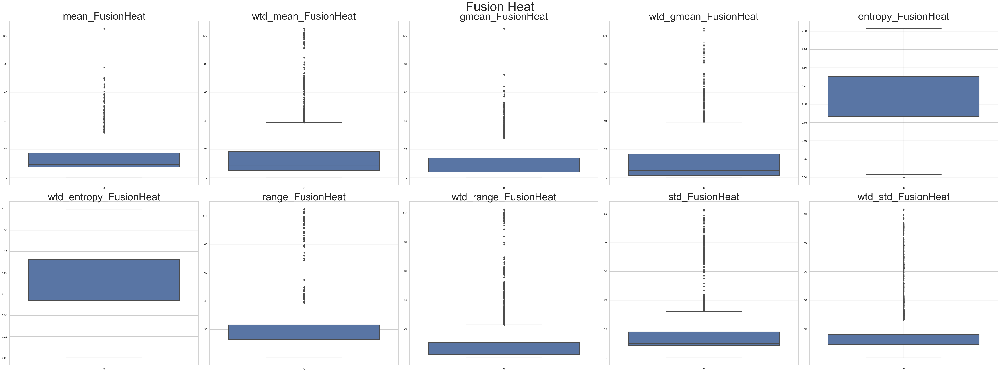

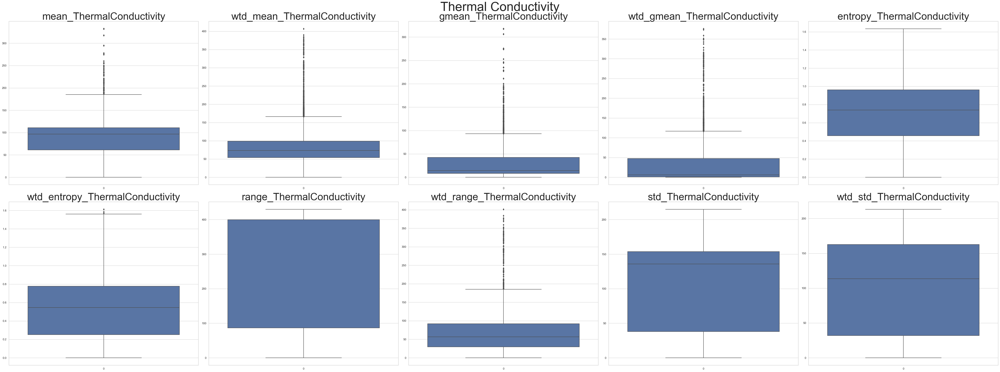

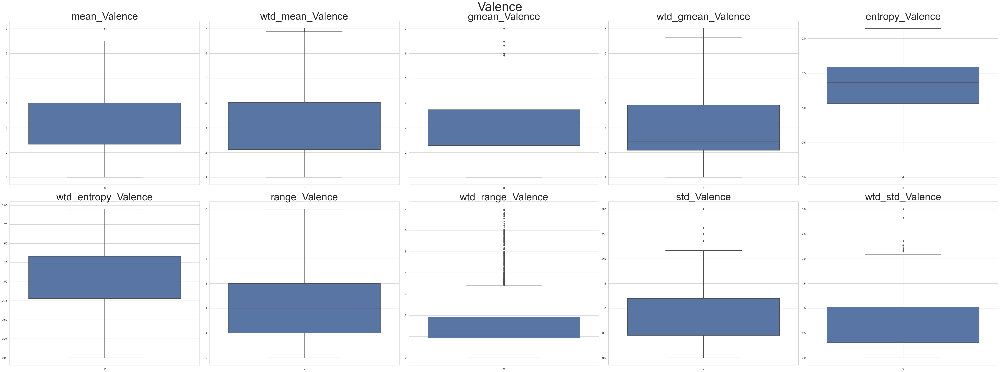

In [15]:

atomic_mass_columns = ['mean_atomic_mass', 'wtd_mean_atomic_mass', 'gmean_atomic_mass', 'wtd_gmean_atomic_mass',
                       'entropy_atomic_mass', 'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
                       'std_atomic_mass', 'wtd_std_atomic_mass']

fie_columns = ['mean_fie', 'wtd_mean_fie', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
               'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie']

atomic_radius_columns = ['mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'wtd_gmean_atomic_radius',
                         'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'range_atomic_radius', 'wtd_range_atomic_radius',
                         'std_atomic_radius', 'wtd_std_atomic_radius']

density_columns = ['mean_Density', 'wtd_mean_Density', 'gmean_Density', 'wtd_gmean_Density',
                   'entropy_Density', 'wtd_entropy_Density', 'range_Density', 'wtd_range_Density',
                   'std_Density', 'wtd_std_Density']

electron_affinity_columns = ['mean_ElectronAffinity', 'wtd_mean_ElectronAffinity', 'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
                             'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity', 'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
                             'std_ElectronAffinity', 'wtd_std_ElectronAffinity']

fusion_heat_columns = ['mean_FusionHeat', 'wtd_mean_FusionHeat', 'gmean_FusionHeat', 'wtd_gmean_FusionHeat',
                       'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'range_FusionHeat', 'wtd_range_FusionHeat',
                       'std_FusionHeat', 'wtd_std_FusionHeat']

thermal_conductivity_columns = ['mean_ThermalConductivity', 'wtd_mean_ThermalConductivity', 'gmean_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
                                'entropy_ThermalConductivity', 'wtd_entropy_ThermalConductivity', 'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
                                'std_ThermalConductivity', 'wtd_std_ThermalConductivity']

valence_columns = ['mean_Valence', 'wtd_mean_Valence', 'gmean_Valence', 'wtd_gmean_Valence',
                   'entropy_Valence', 'wtd_entropy_Valence', 'range_Valence', 'wtd_range_Valence',
                   'std_Valence', 'wtd_std_Valence']




fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(atomic_mass_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Atomic Mass', fontsize=50, y=1.02)
plt.show()




fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(fie_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('FIE', fontsize=50, y=1.02)
plt.show()




fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(atomic_radius_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Atomic Radius', fontsize=50, y=1.02)
plt.show()

#  density_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(density_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Density', fontsize=50, y=1.02)
plt.show()

#  electron_affinity_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(electron_affinity_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Electron Affinity', fontsize=50, y=1.02)
plt.show()

# fusion_heat_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(fusion_heat_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Fusion Heat', fontsize=50, y=1.02)
plt.show()

# thermal_conductivity_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(thermal_conductivity_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Thermal Conductivity', fontsize=50, y=1.02)
plt.show()

# valence_columns
fig, axes = plt.subplots(2, 5, figsize=(55, 20))
axes = axes.flatten()

for i, column in enumerate(valence_columns):
    sns.boxplot(data[column], ax=axes[i])
    axes[i].set_title(column, fontsize=40)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.suptitle('Valence', fontsize=50, y=1.02)
plt.show()

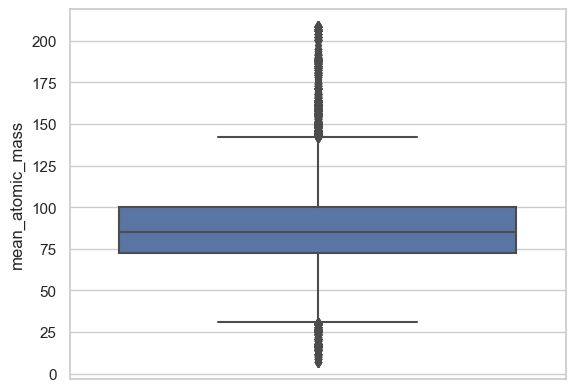

In [ ]:
import seaborn as sns
import tkinter as tk
from tkinter import ttk
import matplotlib.pyplot as plt



def plot_boxplot():
    selected_column = combo_var.get()  # Получаем выбранную колонку из выпадающего списка
    
    sns.boxplot(data=data, y=selected_column)
    plt.show()


root = tk.Tk()
root.title("Boxplot Generator")


columns = data.columns.tolist()

combo_var = tk.StringVar()
combo_box = ttk.Combobox(root, textvariable=combo_var, values=columns, state="readonly")
combo_box.pack(padx=10, pady=10)


button = ttk.Button(root, text="Plot Boxplot", command=plot_boxplot)
button.pack(pady=10)

root.mainloop()

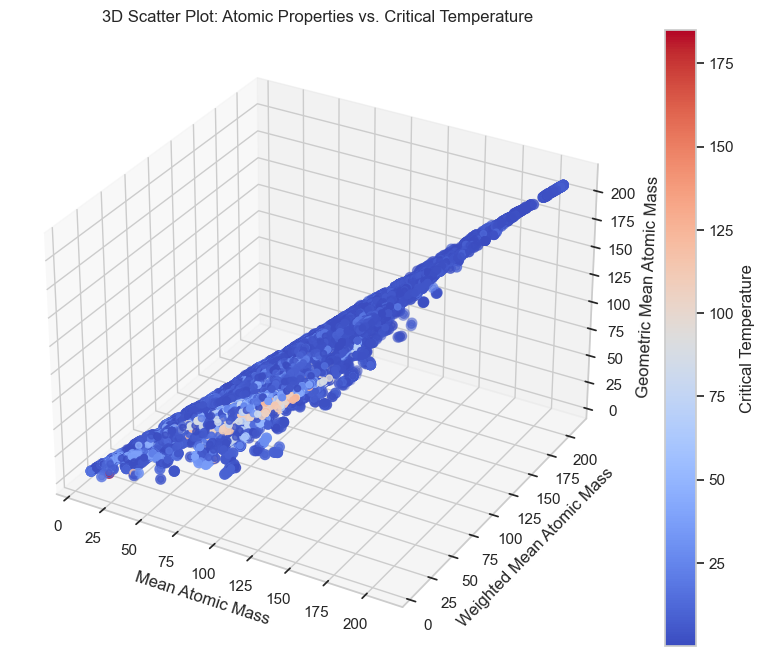

In [17]:
from mpl_toolkits.mplot3d import Axes3D

# Select the variables for the 3D scatter plot
x = data['mean_atomic_mass']
y = data['wtd_mean_atomic_mass']
z = data['gmean_atomic_mass']
critical_temp = data['critical_temp']

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c=critical_temp, cmap='coolwarm', s=50)

# Set labels and title
ax.set_xlabel('Mean Atomic Mass')
ax.set_ylabel('Weighted Mean Atomic Mass')
ax.set_zlabel('Geometric Mean Atomic Mass')
ax.set_title('3D Scatter Plot: Atomic Properties vs. Critical Temperature')

# Add colorbar
cbar = fig.colorbar(ax.scatter(x, y, z, c=critical_temp, cmap='coolwarm'))
cbar.set_label('Critical Temperature')

# Show the plot
plt.show()

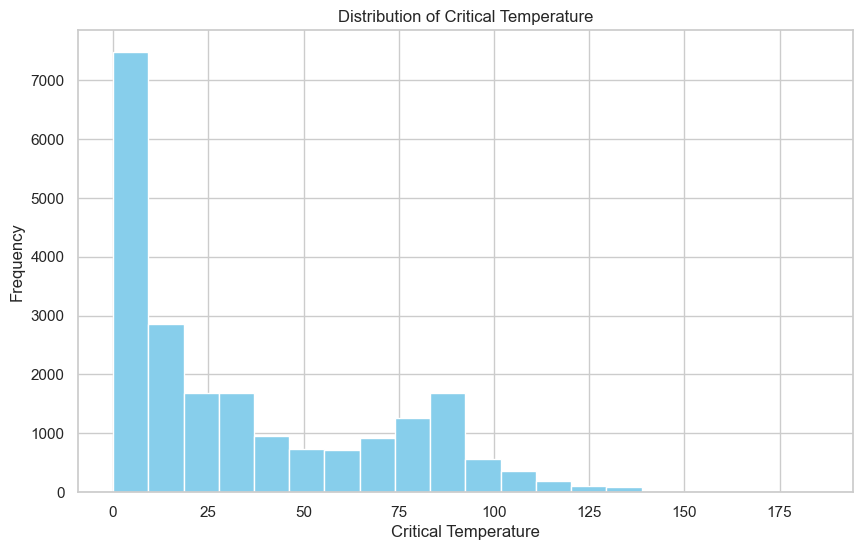

In [18]:
plt.figure(figsize=(10, 6))
plt.hist(data['critical_temp'], bins=20, color='skyblue')


plt.xlabel('Critical Temperature')
plt.ylabel('Frequency')
plt.title('Distribution of Critical Temperature')


plt.show()

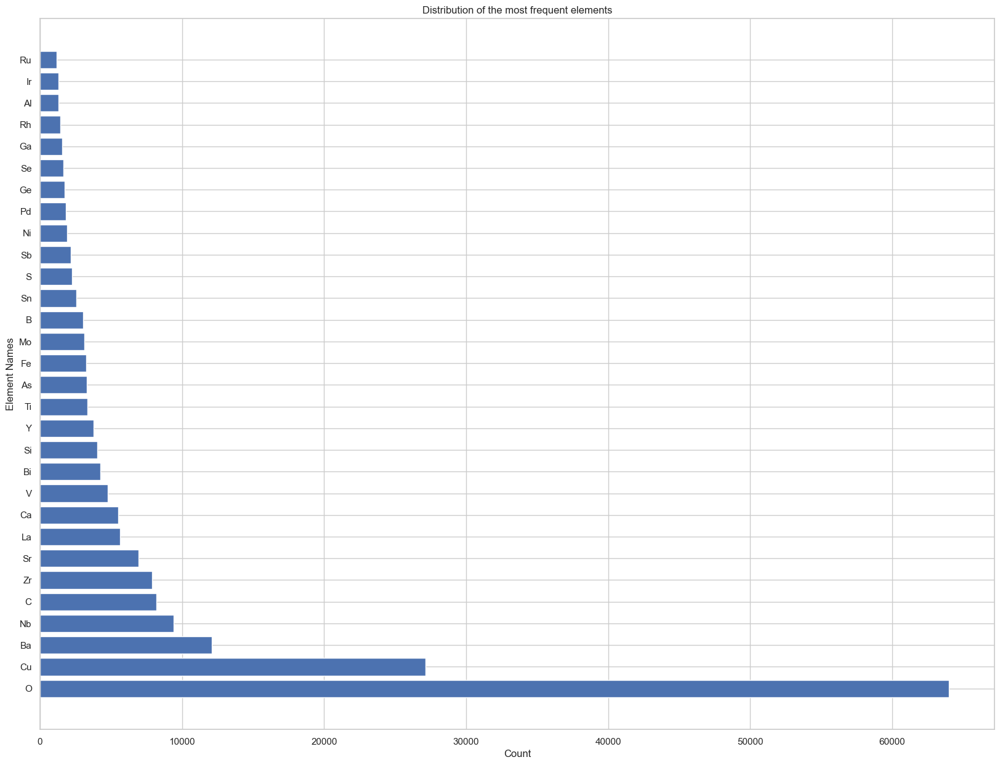

In [56]:
element_counts = elements.drop(['critical_temp', 'material'], axis=1).sum().sort_values(ascending=False)


top_elements = element_counts.head(30)

# Создание диаграммы
plt.figure(figsize=(20, 15))
plt.barh(top_elements.index, top_elements.values)

# Настройка осей и заголовка
plt.xlabel('Count')
plt.ylabel('Element Names')
plt.title('Distribution of the most frequent elements')

# Показать диаграмму
plt.show()

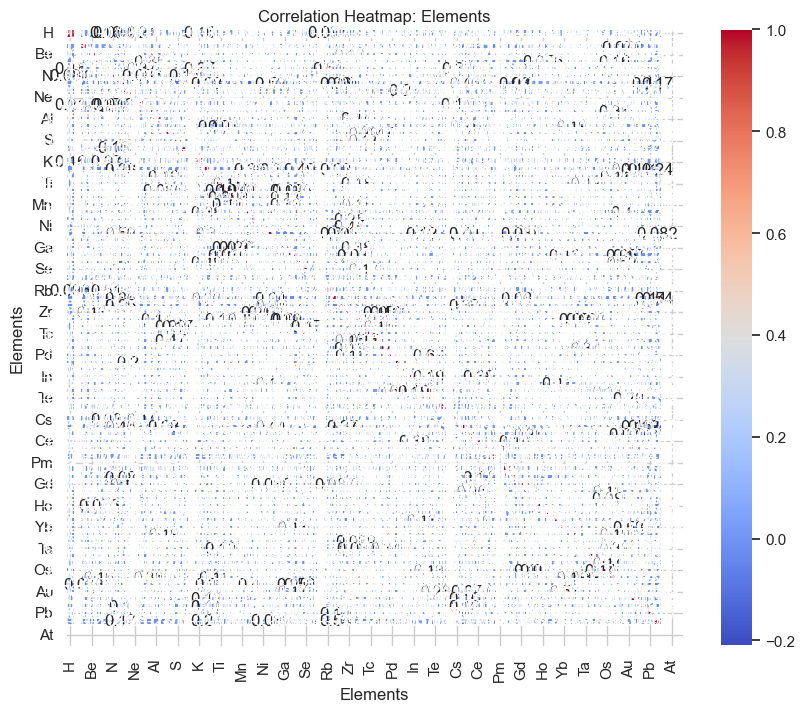

In [67]:
element_columns = elements.columns[elements.columns.get_loc('H'):-2]

# Создайте матрицу корреляции между элементами
corr_matrix = elements[element_columns].corr()

# Создайте тепловую карту
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)

# Настройте оси и заголовок
plt.xlabel('Elements')
plt.ylabel('Elements')
plt.title('Correlation Heatmap: Elements')

# Показать тепловую карту
plt.show()